In [33]:
from keras.models import Sequential
from keras.layers import Conv2D, ZeroPadding2D, Activation, Input, concatenate
from keras.models import Model
from keras.layers.normalization import BatchNormalization
from keras.layers.pooling import MaxPooling2D, AveragePooling2D
from keras.layers.merge import Concatenate
from keras.layers.core import Lambda, Flatten, Dense
from keras.initializers import glorot_uniform
from keras.engine.topology import Layer
from keras import backend as K
K.set_image_data_format('channels_first')
#import cv2
import os
import numpy as np
from numpy import genfromtxt
import pandas as pd
import tensorflow as tf
from fr_utils import *
from inception_blocks_v2 import *
from matplotlib.pyplot import imshow
from urllib2 import urlopen
from PIL import Image, ImageFile
%matplotlib inline
%load_ext autoreload
%autoreload 2

np.set_printoptions(threshold=np.nan)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [109]:
# Image Util Functions 
def read_img_file(f):
    img = Image.open(f)
    
    if img.mode != 'RGB':
        img = img.convert('RGB')
    return img

def resize_img_to_array(img, img_shape=(244, 244)):
    img_array = np.array(
        img.resize(
            img_shape, 
            Image.ANTIALIAS
        )
    )  
    return img_array

def read_img(f):
    return read_img_file(f)

In [35]:
FRmodel = faceRecoModel(input_shape=(3, 96, 96))

In [95]:
print("Total Params:", FRmodel.count_params())

('Total Params:', 3743280)


In [37]:
# GRADED FUNCTION: triplet_loss

def triplet_loss(y_true, y_pred, alpha = 0.2):
    """
    Implementation of the triplet loss as defined by formula (3)
    
    Arguments:
    y_true -- true labels, required when you define a loss in Keras, you don't need it in this function.
    y_pred -- python list containing three objects:
            anchor -- the encodings for the anchor images, of shape (None, 128)
            positive -- the encodings for the positive images, of shape (None, 128)
            negative -- the encodings for the negative images, of shape (None, 128)
    
    Returns:
    loss -- real number, value of the loss
    """
    
    anchor, positive, negative = y_pred[0], y_pred[1], y_pred[2]
    
    ### START CODE HERE ### (≈ 4 lines)
    # Step 1: Compute the (encoding) distance between the anchor and the positive, you will need to sum over axis=-1
    pos_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, positive)), axis = -1)
    # Step 2: Compute the (encoding) distance between the anchor and the negative, you will need to sum over axis=-1
    neg_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, negative)), axis = -1)
    # Step 3: subtract the two previous distances and add alpha.
    basic_loss = pos_dist- neg_dist + alpha
    # Step 4: Take the maximum of basic_loss and 0.0. Sum over the training examples.
    loss = tf.reduce_sum(tf.maximum(basic_loss, 0))
    ### END CODE HERE ###
    
    return loss

In [38]:
#TODO: train from scratch
FRmodel.compile(optimizer = 'adam', loss = triplet_loss, metrics = ['accuracy'])
load_weights_from_FaceNet(FRmodel)

In [40]:
# set up dataframe
NUM_FEATURES = 128
columns = ["gender", "category", "product_id", "filename"]
features_col = ["x_" + str(i) for i in xrange(NUM_FEATURES)]
columns += features_col
df = pd.DataFrame(columns =columns)
print df

Empty DataFrame
Columns: [gender, category, product_id, filename, x_0, x_1, x_2, x_3, x_4, x_5, x_6, x_7, x_8, x_9, x_10, x_11, x_12, x_13, x_14, x_15, x_16, x_17, x_18, x_19, x_20, x_21, x_22, x_23, x_24, x_25, x_26, x_27, x_28, x_29, x_30, x_31, x_32, x_33, x_34, x_35, x_36, x_37, x_38, x_39, x_40, x_41, x_42, x_43, x_44, x_45, x_46, x_47, x_48, x_49, x_50, x_51, x_52, x_53, x_54, x_55, x_56, x_57, x_58, x_59, x_60, x_61, x_62, x_63, x_64, x_65, x_66, x_67, x_68, x_69, x_70, x_71, x_72, x_73, x_74, x_75, x_76, x_77, x_78, x_79, x_80, x_81, x_82, x_83, x_84, x_85, x_86, x_87, x_88, x_89, x_90, x_91, x_92, x_93, x_94, x_95, ...]
Index: []

[0 rows x 132 columns]


In [ ]:
# Feature Extraction for the whole datbase 
# TODO: change all product_ids to strings when saving
def extract_feats():
    CATEGORY = 6
    PRODUCT_ID = 8
    FILE_NAME = 9

    datadir = '/Users/robelmengistu/Documents/CS230_project/data'

    i = 0
    for subdir, dirs, files in os.walk(datadir):
        for img in files:
            if ".DS_" in img: continue
            path = subdir+"/" +img
            path_split = [str(j) for j in path.split("/")]
            row = path_split[CATEGORY:]
            if "afrikrea" in path_split[PRODUCT_ID]: continue 
            feat = img_to_encoding(path, FRmodel).tolist()
            #print "Extracted features for: ", path
            row += feat[0]
            df.loc[i] = row
            i += 1
            if i % 500 == 0:
                print "appended: ", i, "th"
                df.to_csv("FaceNet_feats.csv")
extract_feats() 

In [68]:
meta_path = 'FaceNet_feats.csv'
X = pd.read_csv(meta_path)
print X.shape
X.product_id = X.product_id.astype(str)

(4500, 133)


In [69]:
X_train_conv_2d = X[[_ for _ in X.columns if "x_" in _]].values.astype(np.float)
X_train_conv_2d.shape

(4500, 128)

In [70]:
J = pd.read_csv(meta_path, usecols=['filename', "gender", "category", "product_id"])
print J.shape

(4500, 4)


In [71]:
#Training KNN on 100K images w/ 2K features takes about 2 minutes!
from sklearn.neighbors import NearestNeighbors
knn = NearestNeighbors(n_neighbors=20, n_jobs=8, algorithm='ball_tree')
knn.fit(X_train_conv_2d)

NearestNeighbors(algorithm='ball_tree', leaf_size=30, metric='minkowski',
         metric_params=None, n_jobs=8, n_neighbors=20, p=2, radius=1.0)

In [72]:
#serialize 
from sklearn.externals import joblib
knn_file = 'facenet_conv_feats.pkl'
joblib.dump(knn, knn_file)

['facenet_conv_feats.pkl']

In [82]:
def get_test_set():
    CATEGORY = 6
    PRODUCT_ID = 8
    FILE_NAME = 9

    datadir = '/Users/robelmengistu/Documents/CS230_project/data'
    i = 0
    products_added = []
    test_urls = []

    for subdir, dirs, files in os.walk(datadir):
        for img in files:
            if ".DS_" in img: continue
            path = subdir+"/" +img
            path_split = path.split("/")
            product = path_split[PRODUCT_ID]
            if "afrikrea" in product and product not in products_added:
                products_added.append(product)
                test_urls.append(path)
            else: 
                continue 
            i += 1
    return test_urls

In [73]:
# TODO: change this to a KNN implementation 

def find_closest(image_path, database, model, top = 8):
    encoding = img_to_encoding(image_path, FRmodel)
    
    ## Step 2: Find the top 8 closest encodings ##
    encodings_set = []
    
    for (name, db_enc) in database.items():
        # Compute L2 distance between the target "encoding" and the current "emb" from the database. (≈ 1 line)
        dist = np.linalg.norm(encoding- db_enc)
        encodings_set.append((name, dist))

    encodings_set = sorted(encodings_set, key=lambda x: x[1])
     
    return encodings_set

In [87]:
def get_neighbors_set(f_set, knn_file, model):
    '''
    Loads the KNN file, and a pre-trained neural network.
    Converts image (f) to convoultional features,
    Sends conv features to KNN to find closest hits,
    Plots the top images and their distances.
    '''
    knn = joblib.load(knn_file) 
    neighbors_set = []
    for f in f_set: 
        X_conv_2d = img_to_encoding(f, model)
        neighbors = knn.kneighbors(X_conv_2d, return_distance=True)
        neighbors_set.append(neighbors)
    return neighbors_set

In [107]:
def plot_neighbors(url, neighbors, J, top=8, per_row=4):
    CATEGORY_INDEX = 7   #Note: change depending on data location 
    path_split = url.split("/")
    query_category = path_split[7]
    distance = neighbors[0][0]
    datadir = '/Users/robelmengistu/Documents/CS230_project/data/'
    print "Query: ", query_category
    img = read_img(url) # reads an image link into a NumPy array...
    img_width, img_height = 299,299
    np_img = resize_img_to_array(img, img_shape=(img_width, img_height))
    imshow(np_img)
    
    c = 0 
    i = 0 
    product_recommended = []
    while (True):
        if c == top: break 
        if c % 4 == 0:
             _ , ax = plt.subplots(1, per_row, sharex='col', sharey='row', figsize=(24, 6))
        j = c % 4
        k = neighbors[1][0][i]

        path = datadir + J['gender'][k] + "/" +J['category'][k]+ "/" +str (J['product_id'][k])+"/" + J['filename'][k]
        if not os.path.exists(path): 
            i += 1
            continue 
        image = read_img_file(path)
        if J['product_id'][k] in product_recommended: 
            i += 1
            continue
        i += 1
        c += 1
        product_recommended.append(J['product_id'][k])
        score = accuracy_score (query_category, J['category'][k], top)
        
        image = resize_img_to_array(image, img_shape=(img_width, img_height))
        ax[j].imshow(image)
        ax[j].axis('off')    
        ax[j].annotate(J['category'][k] + "   score: "+ str(score * top)+ "  "+str(distance[i]),
                      (0,0), (0, -32), xycoords='axes fraction', 
                       textcoords='offset points', va='top')
  


In [99]:
def accuracy_score (q_cat, r_cat, num_rec): 

    match_score =  1.0/num_rec
    half_match_score = (1.0/(num_rec * 2))
    
    matching_sets = [["women-dresses","women-outerwear", "women-matching-sets"], ["women-tops", "women-jackets"]]
    
    half_match_set_1 = ["women-jumpsuits", "women-pants-and-shorts","women-matching-sets","women-dresses", "women-skirts"]
    half_match_set_2 = ["women-tops", "women-jackets", "women-dresses", "women-matching-sets", "women-outerwear"]
    
    
    match_tuples = []
    for ms in matching_sets:
        for i in ms:
            for j in ms:
                if i != j: match_tuples.append((i,j))
    
    half_match_tuples = []
    for hs in [half_match_set_1, half_match_set_2]:
        for i in hs:
            for j in hs:
                if i != j: half_match_tuples.append((i,j))
    
    
    if r_cat == q_cat: return match_score
    if (r_cat, q_cat) in match_tuples: return match_score
    if (r_cat, q_cat) in half_match_tuples: return half_match_score
    return 0

In [119]:
# calc the mean avg. precision
def get_map(url, neighbors, J, num_rec=8):
    path_split = url.split("/")
    CATEGORY_INDEX = 7   
    query_category = path_split[7]
    #print "query_category: ", query_category
    distance = neighbors[0][0]
    datadir = '/Users/robelmengistu/Documents/CS230_project/data/'
    c = 0 
    i = 0 
    MAP = 0 
    accuracy = [] 
    product_recommended = []
    while (True):
        if c == num_rec: break 
        k = neighbors[1][0][i]
        #print k, X['product_id'][k]
        if J['product_id'][k] in product_recommended: 
            i += 1
            continue
        #print ("category_rec", J['category'][k])
        accuracy.append(accuracy_score(query_category, J['category'][k], num_rec))
        
        MAP += (sum(accuracy)/len(accuracy))
        
        i += 1
        c += 1
        product_recommended.append(J['product_id'][k])
    
    
    return MAP

In [83]:
test_urls = get_test_set()
dresses_set = test_urls[:450]
other_set = test_urls[2750:3200]  # pants and shorts and skirts

In [114]:
dress_neighbors_set = get_neighbors_set(dresses_set, knn_file, FRmodel)

In [115]:
other_neighbors_set = get_neighbors_set(other_set, knn_file, FRmodel)

In [112]:
# num_rec = 8
# acc = get_map(dresses_set[1], dress_neighbors_set[1], X, num_rec=num_rec)
# print "map: ", acc  
# plot_neighbors(dresses_set[1], dress_neighbors_set[1], X, top=num_rec, per_row=4)

In [143]:
print "TEST SET RESULTS: "
num_rec = 8
dress_accuracy = 0 
acc_factor = 1.0/len(dresses_set)
for i in range(len(dresses_set)):

    acc = get_map(dresses_set[i], dress_neighbors_set[i], X, num_rec=num_rec)
    #if acc > 0.9: print i
    dress_accuracy += (acc*acc_factor)

print "Dress MAP: ", dress_accuracy

other_accuracy = 0

acc_factor = 1.0/len(other_set)
for i in range(len(other_set)):
    acc = get_map(other_set[i], other_neighbors_set[i], X, num_rec=num_rec)
    other_accuracy += (acc*acc_factor)
    #if acc < 0.2: print i
    
print "Other MAP: ", other_accuracy
print "Overall MAP", (other_accuracy + dress_accuracy)/2.0

TEST SET RESULTS: 
Dress MAP:  0.635956679894
Other MAP:  0.382466435185
Overall MAP 0.50921155754


# Some Good Results

MAP:  0.936904761905
Query:  women-dresses


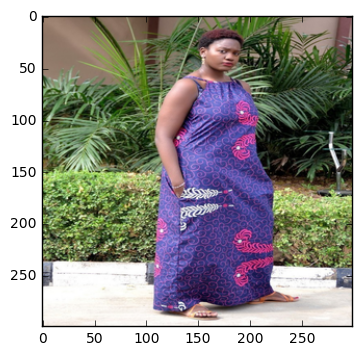

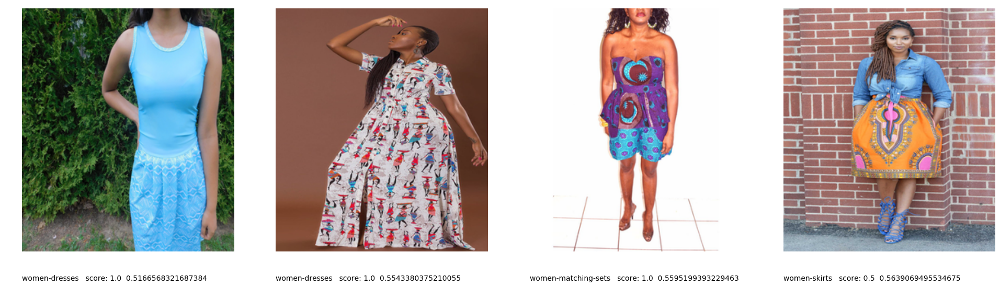

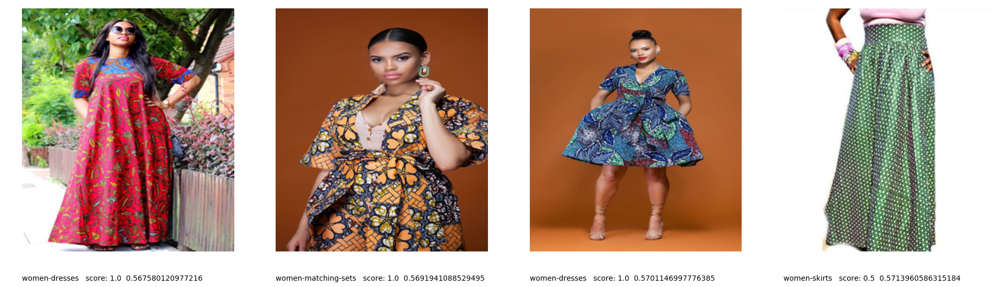

In [141]:
i = 331
num_rec = 8
print "MAP: ", get_map(test_urls[i], dress_neighbors_set[i], X, num_rec=num_rec)
plot_neighbors(test_urls[i], dress_neighbors_set[i], X, top=num_rec, per_row=4)

MAP:  0.960342261905
Query:  women-dresses


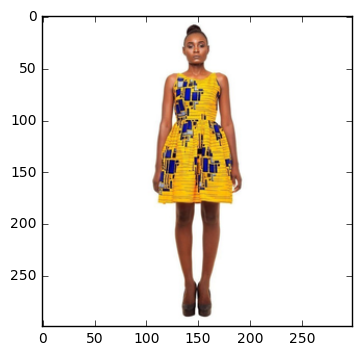

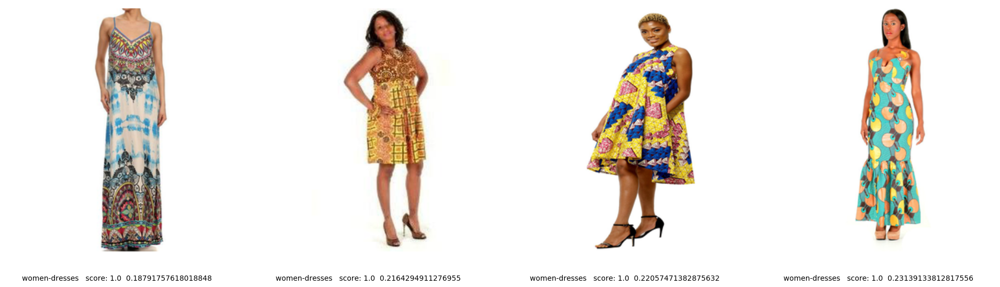

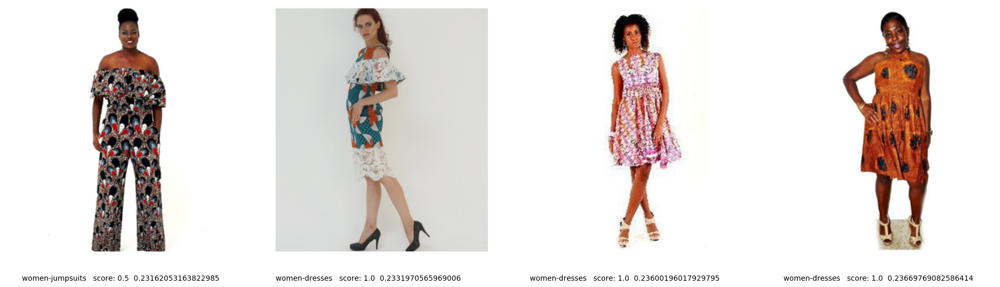

In [142]:
i = 236
num_rec = 8
print "MAP: ", get_map(test_urls[i], dress_neighbors_set[i], X, num_rec=num_rec)
plot_neighbors(test_urls[i], dress_neighbors_set[i], X, top=num_rec, per_row=4)

# Some Bad Results
- Focuses on Face (?)
- Lots of accessories being returned as a result 

MAP:  0.195238095238
Query:  women-dresses


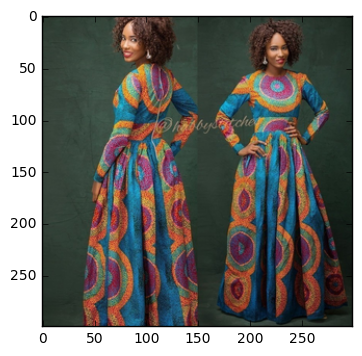

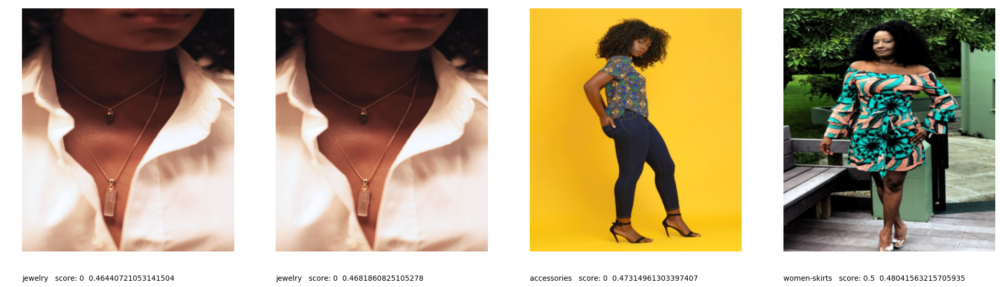

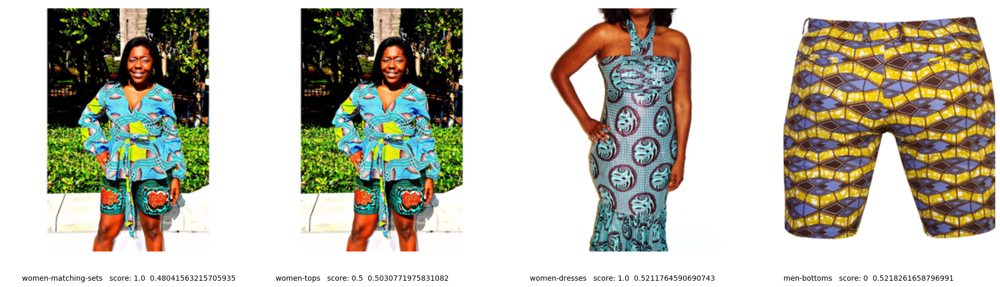

In [135]:
i = 396
num_rec = 8
print "MAP: ", get_map(test_urls[i], dress_neighbors_set[i], X, num_rec=num_rec)
plot_neighbors(test_urls[i], dress_neighbors_set[i], X, top=num_rec, per_row=4)

MAP:  0.149255952381
Query:  women-dresses


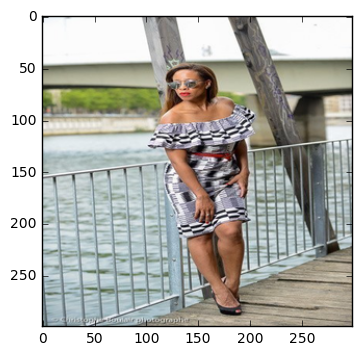

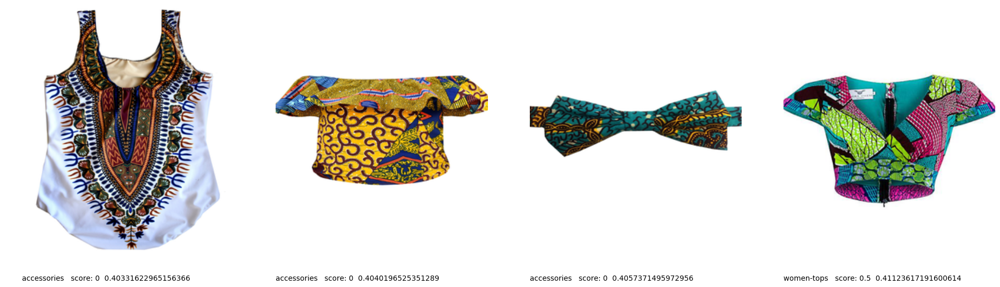

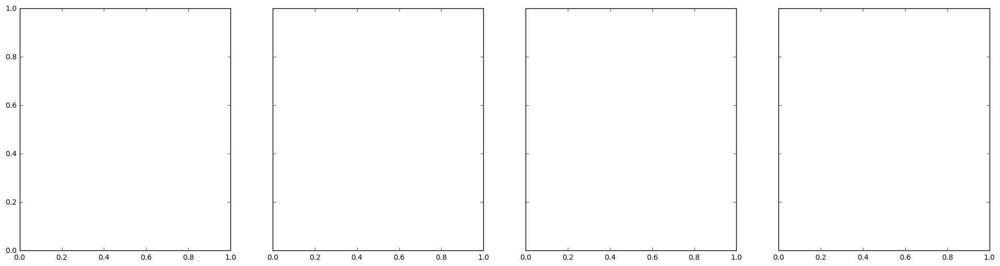

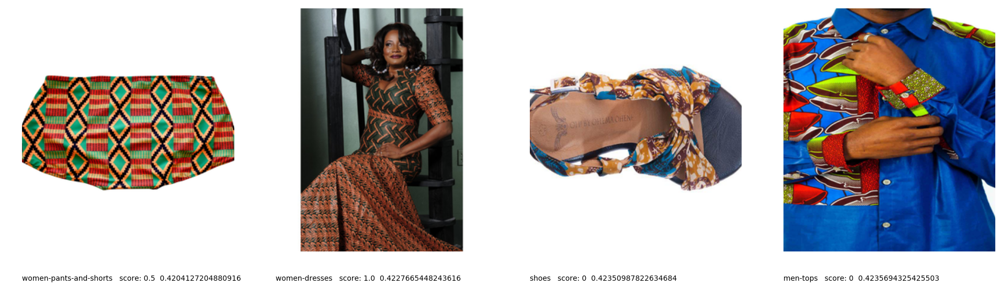

In [131]:
i = 257
num_rec = 8
print "MAP: ", get_map(test_urls[i], dress_neighbors_set[i], X, num_rec=num_rec)
plot_neighbors(test_urls[i], dress_neighbors_set[i], X, top=num_rec, per_row=4)

MAP:  0.111681547619
Query:  women-dresses


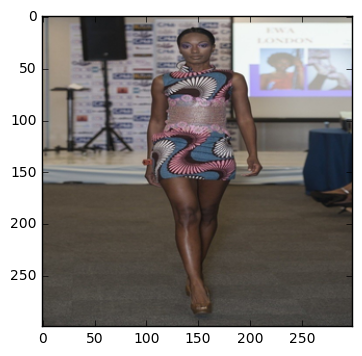

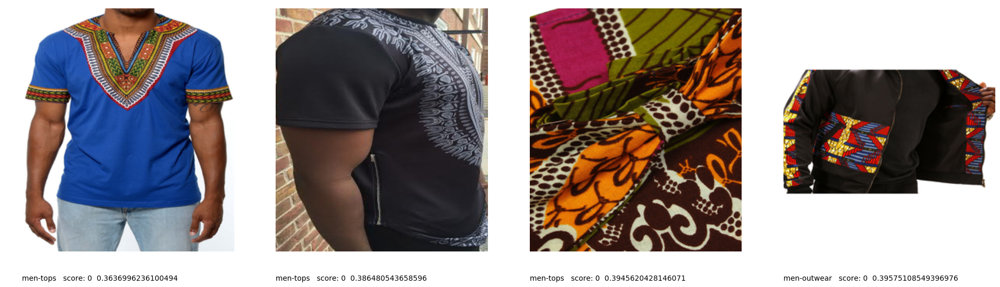

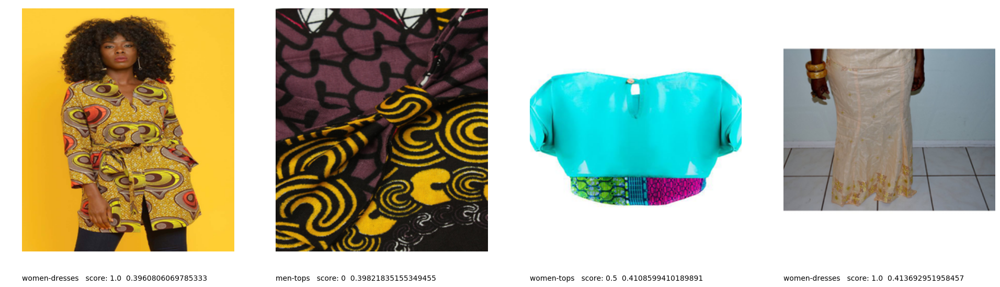

In [129]:
i = 120
num_rec = 8
print "MAP: ", get_map(test_urls[i], dress_neighbors_set[i], X, num_rec=num_rec)
plot_neighbors(test_urls[i], dress_neighbors_set[i], X, top=num_rec, per_row=4)

MAP:  0.151264880952
Query:  women-dresses


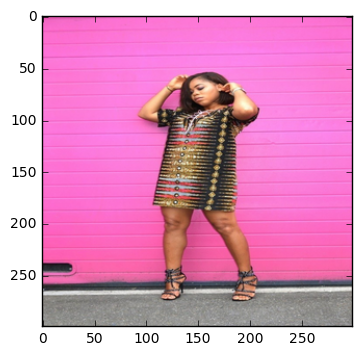

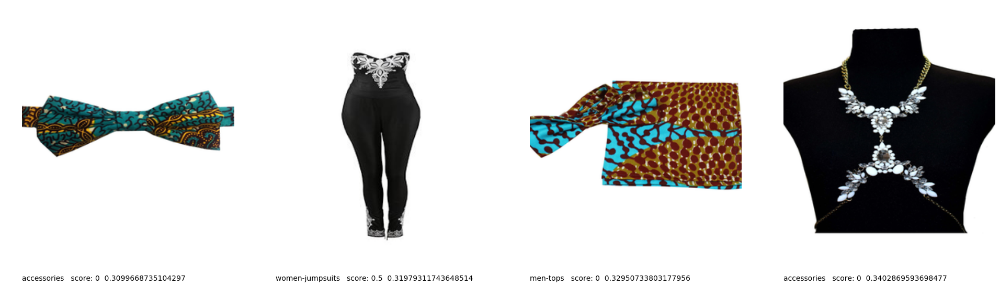

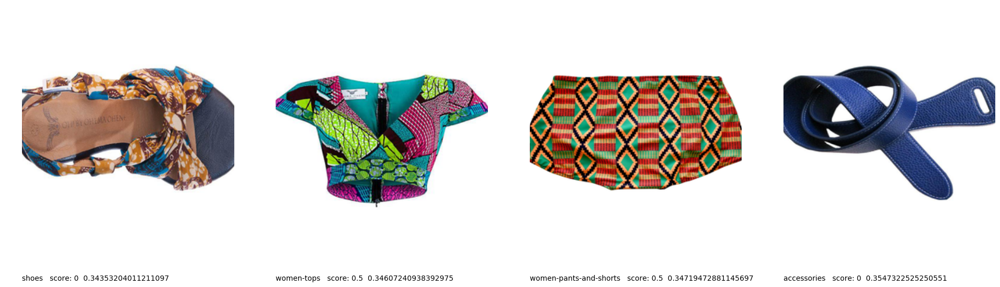

In [127]:
i = 35
num_rec = 8
print "MAP: ", get_map(test_urls[i], dress_neighbors_set[i], X, num_rec=num_rec)
plot_neighbors(test_urls[i], dress_neighbors_set[i], X, top=num_rec, per_row=4)

MAP:  0.109598214286
Query:  women-dresses


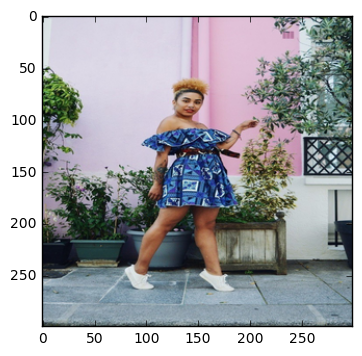

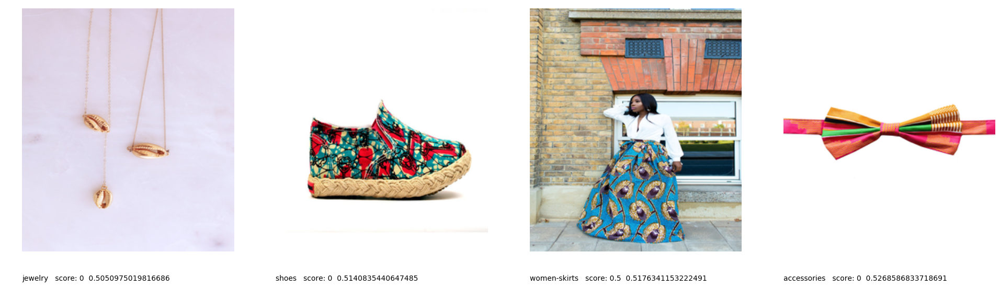

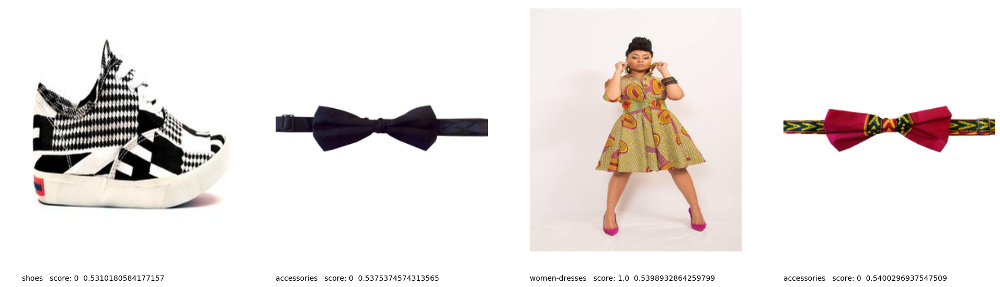

In [125]:
i = 10
num_rec = 8
print "MAP: ", get_map(test_urls[i], dress_neighbors_set[i], X, num_rec=num_rec)
plot_neighbors(test_urls[i], dress_neighbors_set[i], X, top=num_rec, per_row=4)